# Plotting mean NDVI of two agricultural fields

With this code we can plot the mean NDVI for two types of agricultural fields 'corn' and 'grassland' inside a region of Flanders.

### Imports

In [2]:
import os 
import numpy as np
import pandas as pd
import geopandas as gpd 
import matplotlib.pyplot as plt
import seaborn as sns
import rasterio 

%matplotlib inline

In [3]:
parent_dir = "data" 

if not os.path.exists(parent_dir):
    os.makedirs(parent_dir)

sub_dirs = ["agriculture_geodata","processed","sentinel2","export"]

for sub_dir in sub_dirs:
    # Path to the new subdirectory
    sub_dir_path = os.path.join(parent_dir, sub_dir)

    # Create the subdirectory if it doesn't exist
    if not os.path.exists(sub_dir_path):
        os.makedirs(sub_dir_path)
 
parent_dir = "data/sentinel2/" 
sub_dirs=["source","fields"]
for sub_dir in sub_dirs:
    # Path to the new subdirectory
    sub_dir_path = os.path.join(parent_dir, sub_dir)

    # Create the subdirectory if it doesn't exist
    if not os.path.exists(sub_dir_path):
        os.makedirs(sub_dir_path)
 

### Load the agriculture areas shapefile

The geospatial data of all agricultural areas in Flanders region can be obtained through [this link](https://www.vlaanderen.be/datavindplaats/catalogus/landbouwgebruikspercelen-lv-2021)

We output the CRS which is the Lambert72 projection

In [4]:
df_total_agri  = gpd.read_file("./data/agriculture_geodata/Shapefile/Lbgbrprc21.shp") 
df_total_agri.crs

<Projected CRS: PROJCS["BD72 / Belgian Lambert 72",GEOGCS["BD72",D ...>
Name: BD72 / Belgian Lambert 72
Axis Info [cartesian]:
- [east]: Easting (metre)
- [north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: unnamed
- method: Lambert Conic Conformal (2SP)
Datum: Reseau National Belge 1972
- Ellipsoid: International 1924
- Prime Meridian: Greenwich

### Load the Sentinel raster data 

The rasterdata is a Sentinel2 response from the SentinelHub Process API. I've made it available through [this link](https://www.mediafire.com/view/p5mz28kul0gwldg/response.tiff/file) (4.4 MB)

In [5]:
from pathlib import Path
src_img=Path('./data/sentinel2/source/response.tiff')
with rasterio.open(src_img) as src:
    bounds_native=src.bounds
    native_crs=src.crs
    img_data = src.read()
    boundingbox=src.bounds
    img_meta = src.meta.copy()
print (native_crs)

EPSG:4326


# UTM31 projection (Mercator)

Now we're gonna convert the sentinel raster file to UTM 31, aswell as the agriculture shapefile 

#### Get the bounding box of our raster data
We will use this to intersect with the agriculture shapefile to select an area on the map

In [6]:
boundingbox

BoundingBox(left=3.6, bottom=51.212018, right=3.7, top=51.26)

#### Create our raster data in UTM31 projection

In [7]:
from rasterio.warp import calculate_default_transform, reproject, Resampling
from pathlib import Path

src_img = Path('./data/sentinel2/source/response.tiff')
dst_img = Path('./data/sentinel2/source/response_utm31.tiff')

# Define the source and target CRS
src_crs = 'EPSG:4326'
dst_crs = 'EPSG:32631'

# Open the source raster image
with rasterio.open(src_img) as src:
    # Calculate the transformation and the new dimensions of the reprojected raster
    transform, width, height = calculate_default_transform(
        src_crs, dst_crs, src.width, src.height, *src.bounds
    )

    # Copy and update the metadata for the new raster
    img_meta = src.meta.copy()
    img_meta.update({
        'crs': dst_crs,
        'transform': transform,
        'width': width,
        'height': height
    })

    # Create the reprojected raster image
    with rasterio.open(dst_img, 'w', **img_meta) as dst:
        # Reproject each band of the source raster image
        for i in range(1, src.count + 1):
            reproject(
                source=rasterio.band(src, i),
                destination=rasterio.band(dst, i),
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=transform,
                dst_crs=dst_crs,
                resampling=Resampling.nearest
            )

In [8]:
src_img=Path('./data/sentinel2/source/response_utm31.tiff')
with rasterio.open(src_img) as src:
    bounds_native=src.bounds
    native_crs=src.crs
    img_data = src.read()
    boundingbox=src.bounds
    img_meta = src.meta.copy()
print (native_crs)

EPSG:32631


In [9]:
boundingbox

BoundingBox(left=541865.8560863109, bottom=5673570.182994409, right=548897.2412307381, top=5678971.246974481)

#### Convert shapefile to UTM31
We now have our sentinel raster image data and its bounding box in UTM31 projection. 

To select a selected area, we first need to convert our shapefile to UTM31


In [10]:
df_total_agri_utm31 = df_total_agri.to_crs(32631)

In [11]:
# Use the cx method to extract the regions that intersect the bounding box polygon
selected_regions = df_total_agri_utm31.cx[boundingbox[0]:boundingbox[2],
                                boundingbox[1]:boundingbox[3]]

# Write the selected regions to a new shapefile
selected_regions.to_file("./data/processed/agri_region_utm31.shp")

In [12]:
df_agri = gpd.read_file("./data/processed/agri_region_utm31.shp") 
print (df_agri.crs)

EPSG:32631


## Calculate NDVI

For clarity we'll load our UTM31 raster data again.

In [13]:
src_img=Path('./data/sentinel2/source/response_utm31.tiff')
with rasterio.open(src_img) as src:
    bounds_native = src.bounds
    native_crs = src.crs
    img_data = src.read()
    img_meta = src.meta.copy()
print (native_crs)

EPSG:32631


In [14]:
red = img_data[3,:,:]
nir = img_data[7,:,:]

# Set the floating-point error handling to "ignore"
np.seterr(divide='ignore', invalid='ignore')

# Calculate the NDVI array
ndvi = (nir - red) / (nir + red)

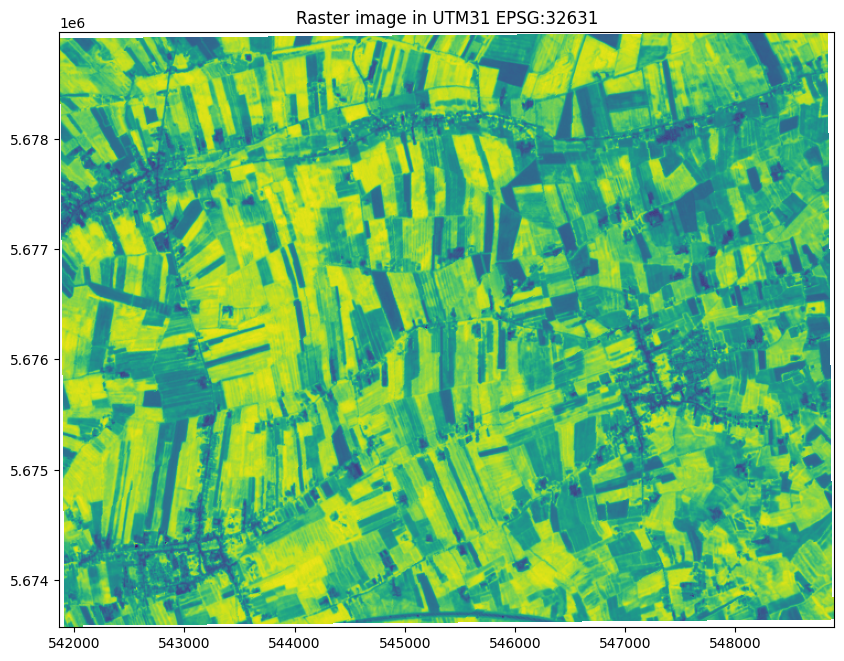

In [15]:
from rasterio.plot import show

# Plot the raster image
fig, ax = plt.subplots(figsize=(10, 10))
show(ndvi, transform=img_meta['transform'], ax=ax)
ax.set_title("Raster image in UTM31 EPSG:32631") 

plt.show()

## Plot both maps

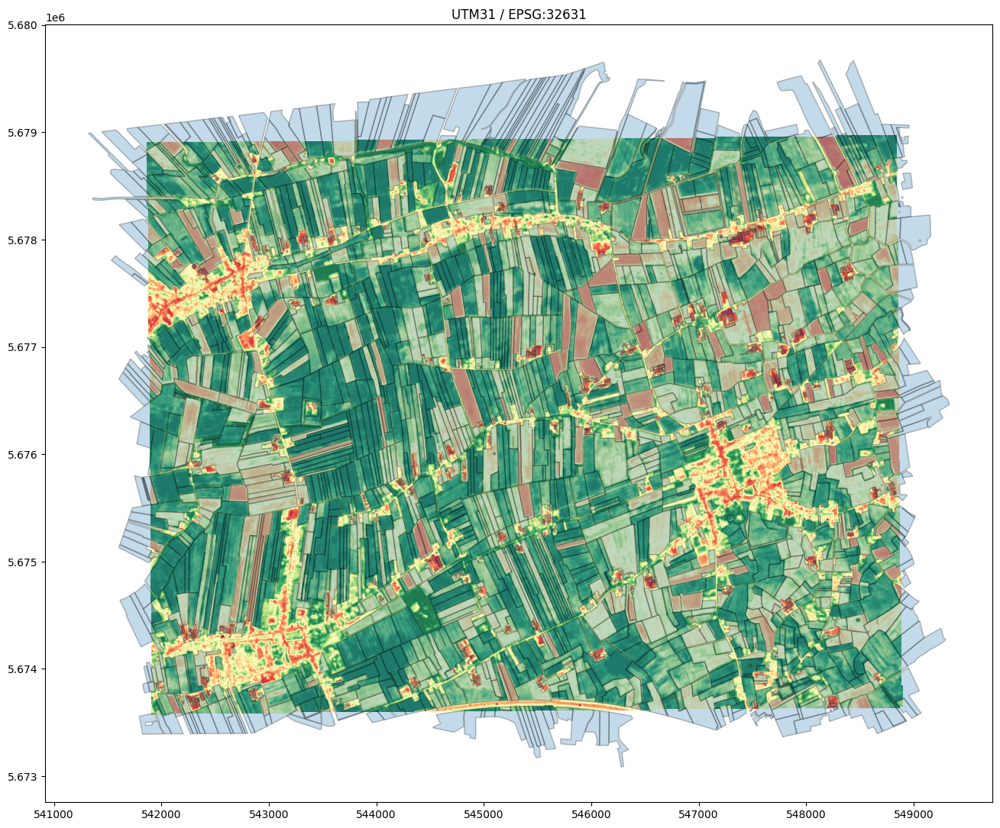

In [16]:
# Plot the raster image
factor=1.33
fig, ax = plt.subplots(figsize=(16, 16))
ax.set_aspect('equal')
show(ndvi*factor, transform=img_meta['transform'], ax=ax, alpha=0.88, cmap='RdYlGn', vmin=0, vmax=1)
ax = df_agri.plot(ax=ax, alpha=0.272, edgecolor='k')
ax.set_title("UTM31 / EPSG:32631")
plt.show()

# Translating to English

Let's translate our database to English. I've made a Python file with a custom function to do so.


In [17]:
from scripts.custom_translator import translate_to_ENG
df_agri=translate_to_ENG(df_agri=df_agri)

# Selecting a field

Now let's select a field in this area so that we can get statistical data for it. To do so we will project the labels from our agricultural fields database. Because the image would get crowded, let's do this for the ten biggest fields. we can then get their coordinates 

In [18]:
df_agri

,OIDN,UIDN,ALVID,HFDTLT,LBLHFDTLT,CROP_TYPE,PM,LBLPM,LENGTH,SURF_AREA,geometry
0,352798,352798,455464712,201,Silage corn,Corn,NaN,NaN,714.21,21574.69,"POLYGON ((542684.544 5678076.495, 542682.070 5..."
1,365839,1278351,817333720,201,Silage corn,Corn,NaN,NaN,247.33,1968.05,"POLYGON ((543484.545 5673738.299, 543483.532 5..."
2,472942,1021324,741777891,999,Unspecified crop - small farmer,Other crops,NaN,NaN,614.92,6716.74,"POLYGON ((545353.092 5677725.313, 545327.664 5..."
3,951242,1813016,1312073732,4,Hedgerows and woodlots <= 10 m wide,Woody crops,NaN,NaN,830.15,1064.19,"POLYGON ((547894.792 5673768.010, 547772.984 5..."
4,1027968,1889742,1320359754,202,Grain corn,Corn,NaN,NaN,207.94,1888.20,"POLYGON ((547048.233 5677198.475, 547046.718 5..."
...,...,...,...,...,...,...,...,...,...,...,...
2529,1828767,4699016,2194577308,201,Silage corn,Corn,BGG,Perennial grassland plowed,1327.08,31106.87,"POLYGON ((543675.100 5676147.454, 543264.645 5..."
2530,1829104,4699353,2197748194,60,Grassland,Grassland,NaN,NaN,161.75,1401.27,"POLYGON ((547784.865 5677099.427, 547786.182 5..."
2531,1829274,4699523,2196541556,60,Grassland,Grassland,NaN,NaN,561.56,5609.82,"POLYGON ((542226.971 5675908.192, 542228.169 5..."
2532,1829275,4699524,2196541758,60,Grassland,Grassland,NaN,NaN,94.15,467.22,"POLYGON ((542269.135 5675823.222, 542271.293 5..."


In [19]:
df_large_fields=df_agri.nlargest(9,'SURF_AREA')
type(df_large_fields)

geopandas.geodataframe.GeoDataFrame

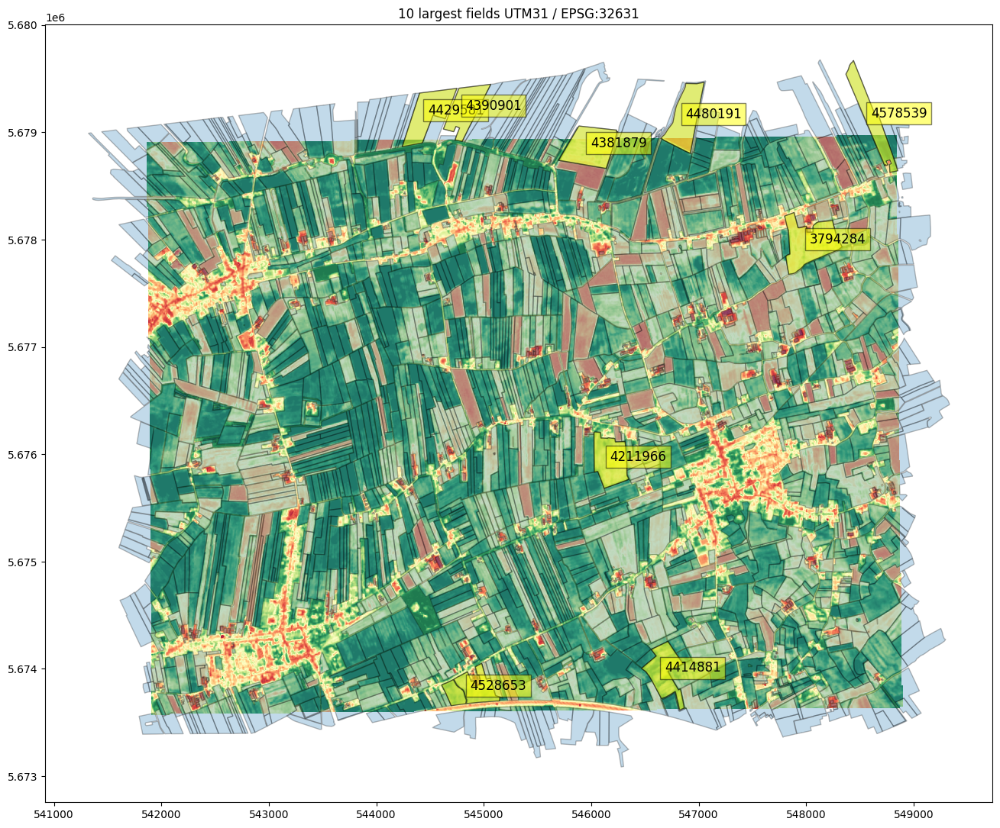

In [20]:
# Plot the raster image
factor=1.33
fig, ax = plt.subplots(figsize=(16, 16))
ax.set_aspect('equal')
show(ndvi*factor, transform=img_meta['transform'], ax=ax, alpha=0.88, cmap='RdYlGn', vmin=0, vmax=1)
ax = df_agri.plot(ax=ax, alpha=0.272, edgecolor='k')
# Plot the large fields with yellow fill color
df_large_fields.plot(ax=ax, facecolor='yellow', edgecolor='k', alpha=0.5)

# Add the UIDN values from df_large_fields
for idx, row in df_large_fields.iterrows():
    ax.text(
        row.geometry.centroid.x,
        row.geometry.centroid.y,
        row.UIDN,
        fontsize=12,
        bbox=dict(facecolor='yellow', alpha=0.5),
    )

ax.set_title("10 largest fields UTM31 / EPSG:32631")
plt.show()

#### Zooming in on field number 4211966

In [21]:
df_agri[df_agri['UIDN'] == 4211966]

,OIDN,UIDN,ALVID,HFDTLT,LBLHFDTLT,CROP_TYPE,PM,LBLPM,LENGTH,SURF_AREA,geometry
696,1065789,4211966,1126469888,201,Silage corn,Corn,NaN,NaN,1540.61,123114.26,"POLYGON ((546087.100 5676202.746, 546091.206 5..."


Let's create a bounding box around this field and project it

In [22]:
field_bbox=df_agri[df_agri['UIDN'] == 4211966].total_bounds
 
field_bbox[0]=field_bbox[0]-200
field_bbox[1]=field_bbox[1]-100
field_bbox[2]=field_bbox[2]+200
field_bbox[3]=field_bbox[3]+200

field_4211966_bbox=field_bbox

field_bbox=df_agri[df_agri['UIDN'] == 3794284].total_bounds

field_bbox[0]=field_bbox[0]-200
field_bbox[1]=field_bbox[1]-100
field_bbox[2]=field_bbox[2]+200
field_bbox[3]=field_bbox[3]+200

field_3794284_bbox=field_bbox

In [62]:
from scripts.load_field_image import Field
field= Field(4211966)
field_bbox=field.bounding_box()
field_id=field.get_id()

#### Intersection

In [24]:
field_region = df_agri.cx[field_bbox[0]:field_bbox[2],
                                field_bbox[1]:field_bbox[3]]

# Write the selected regions to a new shapefile
field_region.to_file("./data/processed/field_region_utm31.shp")

df_field = gpd.read_file("./data/processed/field_region_utm31.shp") 
print (df_field.crs)

EPSG:32631


#### Sentinel file

With from-bounds we select the field bounding box region of our raster data 

In [25]:

from rasterio.windows import from_bounds

src_img=Path('./data/sentinel2/source/response_utm31.tiff')

with rasterio.open(src_img) as src:
    bounds_native=src.bounds
    native_crs=src.crs 
    img_meta = src.meta.copy()
     
    # Create a window from the bounding box coordinates
    window = from_bounds(*field_bbox, src.transform)

    img_data = src.read(window=window)

    # Update the metadata to reflect the windowed data
    img_meta.update({
        "height": window.height,
        "width": window.width,
        "transform": src.window_transform(window)
    })

print (native_crs)

EPSG:32631


In [26]:
red = img_data[3,:,:]
nir = img_data[7,:,:]

# Calculate the NDVI array
ndvi = (nir - red) / (nir + red)

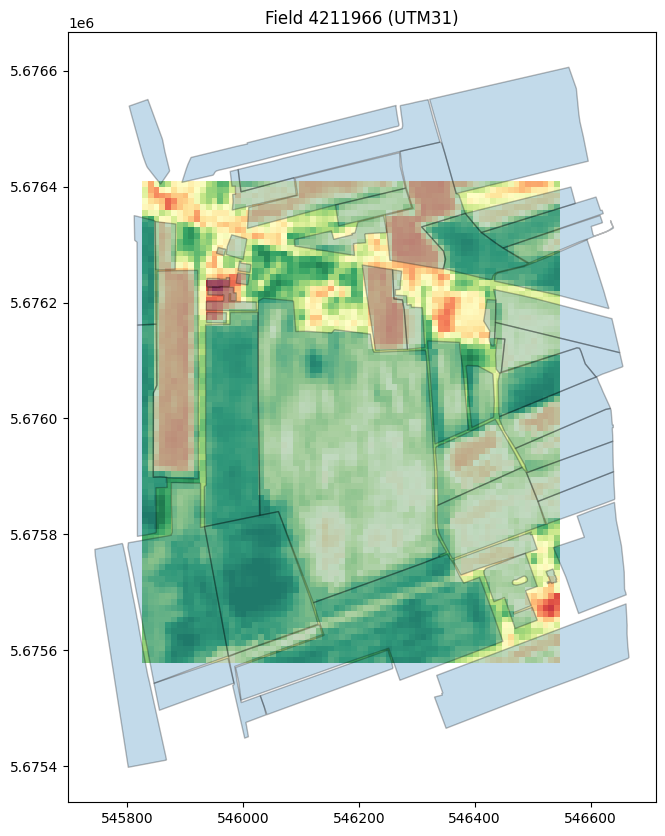

In [27]:
# Plot the raster image
factor=1.33
fig, ax = plt.subplots(figsize=(10,10))
ax.set_aspect('equal')
show(ndvi*factor, transform=img_meta['transform'], ax=ax, alpha=0.88, cmap='RdYlGn', vmin=0, vmax=1)
ax = df_field.plot(ax=ax, alpha=0.272, edgecolor='k')  
ax.set_title(f"Field {field_id} (UTM31)")
plt.show()

# Using the SentinelHub statistical API

Now we can gather statistical data for this field!

In [28]:
from sentinelhub import (
    CRS,
    BBox,
    DataCollection,
    Geometry,
    SentinelHubStatistical,
    SentinelHubStatisticalDownloadClient,
    SHConfig,
    parse_time,
    MosaickingOrder,
)

config = SHConfig('francode-profile') 

if not config.sh_client_id or not config.sh_client_secret:
    print("Warning! To use Statistical API, please provide the credentials (OAuth client ID and client secret).")


In [29]:
def stats_to_df(stats_data):
    """Transform Statistical API response into a pandas.DataFrame"""
    df_data = []

    for single_data in stats_data["data"]:
        df_entry = {}
        is_valid_entry = True

        df_entry["interval_from"] = parse_time(single_data["interval"]["from"]).date()
        df_entry["interval_to"] = parse_time(single_data["interval"]["to"]).date()

        for output_name, output_data in single_data["outputs"].items():
            for band_name, band_values in output_data["bands"].items():
                band_stats = band_values["stats"]
                if band_stats["sampleCount"] == band_stats["noDataCount"]:
                    is_valid_entry = False
                    break

                for stat_name, value in band_stats.items():
                    col_name = f"{output_name}_{band_name}_{stat_name}"
                    if stat_name == "percentiles":
                        for perc, perc_val in value.items():
                            perc_col_name = f"{col_name}_{perc}"
                            df_entry[perc_col_name] = perc_val
                    else:
                        df_entry[col_name] = value

        if is_valid_entry:
            df_data.append(df_entry)

    return pd.DataFrame(df_data)

### Make a Statistical API request

In the Process API tutorial, we have seen how to obtain satellite imagery. Statistical API can be used in a very similar way. The main difference is that the results of Statistical API are aggregated statistical values of satellite data instead of entire images. In many use cases, such values are all that we need. By using Statistical API we can avoid downloading and processing large amounts of satellite data.

We have two polygons describing our fields

In [30]:
polygons_gdf = df_agri[df_agri['UIDN'].isin([4211966, 3794284])]
polygons_gdf

,OIDN,UIDN,ALVID,HFDTLT,LBLHFDTLT,CROP_TYPE,PM,LBLPM,LENGTH,SURF_AREA,geometry
371,1546307,3794284,1962930796,60,Grassland,Grassland,NaN,NaN,2092.84,166323.75,"POLYGON ((547926.281 5678110.953, 547931.623 5..."
696,1065789,4211966,1126469888,201,Silage corn,Corn,NaN,NaN,1540.61,123114.26,"POLYGON ((546087.100 5676202.746, 546091.206 5..."


### Load the NDVI evalscript

In [31]:
yearly_time_interval = "2020-01-01", "2022-12-31"

with open("./scripts/ndvi_evalscript.js","r") as f:
    ndvi_evalscript=f.read()

#print (ndvi_evalscript)


### Create the API request

In [32]:
aggregation = SentinelHubStatistical.aggregation(
    evalscript=ndvi_evalscript, time_interval=yearly_time_interval, aggregation_interval="P1D", resolution=(10, 10)
)

input_data = SentinelHubStatistical.input_data(DataCollection.SENTINEL2_L2A)

histogram_calculations = {"ndvi": {"histograms": {"default": {"nBins": 20, "lowEdge": -1.0, "highEdge": 1.0}}}}

ndvi_requests = []

for geo_shape in polygons_gdf.geometry.values:
    request = SentinelHubStatistical(
        aggregation=aggregation,
        input_data=[input_data],
        geometry=Geometry(geo_shape, crs=CRS(polygons_gdf.crs)),
        calculations=histogram_calculations,
        config=config,
    )
    ndvi_requests.append(request)

### Make the API request

In [33]:
%%time

download_requests = [ndvi_request.download_list[0] for ndvi_request in ndvi_requests]

client = SentinelHubStatisticalDownloadClient(config=config)

ndvi_stats = client.download(download_requests)

len(ndvi_stats)

CPU times: total: 1.58 s
Wall time: 29.5 s


2

#### Show the NDVI data

In [34]:
ndvi_stats

[{'data': [{'interval': {'from': '2020-01-01T00:00:00Z',
     'to': '2020-01-02T00:00:00Z'},
    'outputs': {'ndvi': {'bands': {'B0': {'stats': {'min': 0.030559075996279716,
         'max': 0.646532416343689,
         'mean': 0.23377426419238814,
         'stDev': 0.13456365321234656,
         'sampleCount': 3021,
         'noDataCount': 1272},
        'histogram': {'bins': [{'lowEdge': -1.0, 'highEdge': -0.9, 'count': 0},
          {'lowEdge': -0.9, 'highEdge': -0.8, 'count': 0},
          {'lowEdge': -0.8, 'highEdge': -0.7, 'count': 0},
          {'lowEdge': -0.7, 'highEdge': -0.6, 'count': 0},
          {'lowEdge': -0.6, 'highEdge': -0.5, 'count': 0},
          {'lowEdge': -0.5, 'highEdge': -0.3999999999999999, 'count': 0},
          {'lowEdge': -0.3999999999999999,
           'highEdge': -0.29999999999999993,
           'count': 0},
          {'lowEdge': -0.29999999999999993,
           'highEdge': -0.19999999999999996,
           'count': 0},
          {'lowEdge': -0.1999999999999

### Load the data into a dataframe

Here we load the statistical data response into a geopandas dataframe

In [35]:
ndvi_dfs = [stats_to_df(polygon_stats) for polygon_stats in ndvi_stats]

for df, land_type in zip(ndvi_dfs, polygons_gdf["CROP_TYPE"].values):
    df["land_type"] = land_type

ndvi_df = pd.concat(ndvi_dfs)

ndvi_df

,interval_from,interval_to,ndvi_B0_min,ndvi_B0_max,ndvi_B0_mean,ndvi_B0_stDev,ndvi_B0_sampleCount,ndvi_B0_noDataCount,land_type
0,2020-01-01,2020-01-02,0.030559,0.646532,0.233774,0.134564,3021,1272,Grassland
1,2020-01-04,2020-01-05,0.441509,0.853218,0.703069,0.070006,3021,1272,Grassland
2,2020-01-06,2020-01-07,0.375667,0.911330,0.858206,0.049875,3021,1272,Grassland
3,2020-01-09,2020-01-10,0.044507,0.137211,0.081891,0.013830,3021,1272,Grassland
4,2020-01-11,2020-01-12,0.112914,0.191450,0.157415,0.010945,3021,1272,Grassland
...,...,...,...,...,...,...,...,...,...
428,2022-12-19,2022-12-20,0.010027,0.086232,0.051480,0.013826,1749,427,Corn
429,2022-12-21,2022-12-22,0.025085,0.105756,0.056928,0.012763,1749,427,Corn
430,2022-12-24,2022-12-25,0.205492,0.329114,0.260202,0.020892,1749,427,Corn
431,2022-12-26,2022-12-27,-0.015831,0.157115,0.065014,0.029233,1749,427,Corn


### Plot the data from our ndvi_df

Text(0.5, 1.0, 'NDVI (mean)')

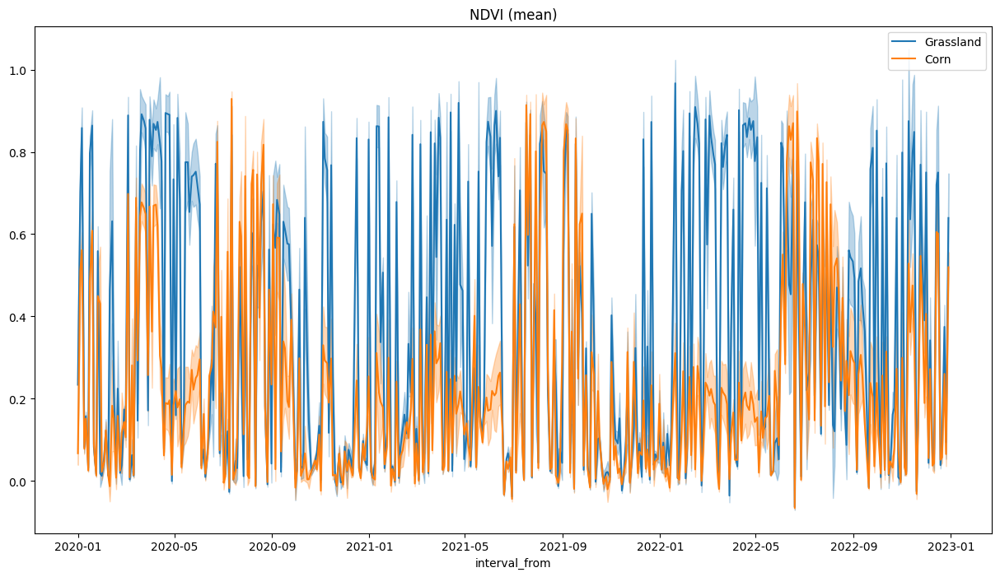

In [36]:
fig, ax = plt.subplots(figsize=(15, 8))

for idx, land_type in enumerate(polygons_gdf["CROP_TYPE"].values):
    series = ndvi_df[ndvi_df["land_type"] == land_type]

    series.plot(ax=ax, x="interval_from", y="ndvi_B0_mean", color=f"C{idx}", label=land_type)

    ax.fill_between(
        series.interval_from.values,
        series["ndvi_B0_mean"] - series["ndvi_B0_stDev"],
        series["ndvi_B0_mean"] + series["ndvi_B0_stDev"],
        color=f"C{idx}",
        alpha=0.3,
    );
ax.set_title('NDVI (mean)')

# Reducing request processing units and mask clouds with CLM

In case of large-scale processing, it becomes important, how many processing units we spend making Statistical API requests. We can decrease this number if we write an evalscript that outputs integer values instead of floats.

We will download statistics for all Sentinel-2 L2A bands, cloud masks and probabilities.

### Load the evalscript from file

The evalscript will:

- request band values in digital numbers, instead of reflectances,

- use toUINT function to convert values from indices into integers that will fit into SampleType.UINT16,

- mask pixels for which cloud mask CLM indicates that they contain clouds. Such pixels will not be included in statistics.

In [37]:
with open("./scripts/features_evalscript.js","r") as f:
    features_evalscript=f.read()

#print (features_evalscript)

### Create requests

We can combine different requests for each field into one request to save processing units.

In [38]:
aggregation = SentinelHubStatistical.aggregation(
    evalscript=features_evalscript, time_interval=yearly_time_interval, aggregation_interval="P1D", resolution=(10, 10)
)
# Adding percentiles
calculations = {"default": {"statistics": {"default": {"percentiles": {"k": [5, 50, 95]}}}}}

features_requests = []
for geo_shape in polygons_gdf.geometry.values:
    request = SentinelHubStatistical(
        aggregation=aggregation,
        input_data=[SentinelHubStatistical.input_data(DataCollection.SENTINEL2_L2A)],
        geometry=Geometry(geo_shape, crs=CRS(polygons_gdf.crs)),
        calculations=calculations,
        config=config,
    )

    features_requests.append(request)

### Make the API client request

In [39]:
%%time

download_requests = [request.download_list[0] for request in features_requests]

client = SentinelHubStatisticalDownloadClient(config=config)

features_stats = client.download(download_requests)

len(features_stats)

CPU times: total: 1.14 s
Wall time: 30.8 s


2

### Conversion of statistical data into dataframe

We can use the function provided in the Sentinelhub documentation to load our data in a GeoPandas dataframe.

In [40]:
features_dfs = [stats_to_df(polygon_stats) for polygon_stats in features_stats]

for df, land_type in zip(features_dfs, polygons_gdf["CROP_TYPE"].values):
    df["land_type"] = land_type

features_df = pd.concat(features_dfs)

features_df.head()

,interval_from,interval_to,indices_NDVI_min,indices_NDVI_max,indices_NDVI_mean,indices_NDVI_stDev,indices_NDVI_sampleCount,indices_NDVI_noDataCount,indices_NDVI_percentiles_5.0,indices_NDVI_percentiles_95.0,...,bands_B12_min,bands_B12_max,bands_B12_mean,bands_B12_stDev,bands_B12_sampleCount,bands_B12_noDataCount,bands_B12_percentiles_5.0,bands_B12_percentiles_95.0,bands_B12_percentiles_50.0,land_type
0,2020-01-06,2020-01-07,6878.0,9557.0,9291.024585,249.384246,3021,1272,8947.0,9487.0,...,562.0,2251.0,998.502001,122.777964,3021,1272,854.0,1156.0,995.0,Grassland
1,2020-01-16,2020-01-17,6948.0,9261.0,8976.948702,218.237281,3021,1403,8630.0,9176.0,...,543.0,1396.0,799.889988,68.570781,3021,1403,708.0,889.0,798.0,Grassland
2,2020-01-19,2020-01-20,7380.0,9561.0,9320.496284,184.709723,3021,1272,9064.0,9488.0,...,622.0,1292.0,855.475700,51.552624,3021,1272,788.0,917.0,855.0,Grassland
3,2020-03-04,2020-03-05,7332.0,9785.0,9444.301887,224.442546,3021,1272,9078.0,9675.0,...,337.0,729.0,439.989137,40.062122,3021,1272,391.0,509.0,434.0,Grassland
4,2020-03-21,2020-03-22,7178.0,9721.0,9458.541452,220.148781,3021,1272,9104.0,9654.0,...,586.0,1663.0,790.782161,100.887072,3021,1272,664.0,925.0,776.0,Grassland


### Rescaling the data from int

Next, we can rescale values back to the correct scale. The following will:

- convert statistical values for bands from digital numbers to reflectances,

- apply an inverse transformation of toUINT function on statistical values for indices.

In [41]:
BANDS = DataCollection.SENTINEL2_L2A.bands
INDICES = ["NDVI", "NDVI_RE1", "NBSI", "CLP", "NDSI"]
STATISTICAL_QUANTITIES = ["mean", "min", "max", "stDev", "percentiles_5.0", "percentiles_50.0", "percentiles_95.0"]

for band in BANDS:
    for stat in STATISTICAL_QUANTITIES:
        column_name = f"bands_{band.name}_{stat}"
        column = features_df[column_name]

        column = column / 10000.0

        features_df[column_name] = column

for index in INDICES:
    for stat in STATISTICAL_QUANTITIES:
        column_name = f"indices_{index}_{stat}"
        column = features_df[column_name]

        if stat == "stDev":
            column = column / 5000.0
        else:
            column = (column - 5000.0) / 5000.0

        features_df[column_name] = column

features_df.head()

,interval_from,interval_to,indices_NDVI_min,indices_NDVI_max,indices_NDVI_mean,indices_NDVI_stDev,indices_NDVI_sampleCount,indices_NDVI_noDataCount,indices_NDVI_percentiles_5.0,indices_NDVI_percentiles_95.0,...,bands_B12_min,bands_B12_max,bands_B12_mean,bands_B12_stDev,bands_B12_sampleCount,bands_B12_noDataCount,bands_B12_percentiles_5.0,bands_B12_percentiles_95.0,bands_B12_percentiles_50.0,land_type
0,2020-01-06,2020-01-07,0.3756,0.9114,0.858205,0.049877,3021,1272,0.7894,0.8974,...,0.0562,0.2251,0.099850,0.012278,3021,1272,0.0854,0.1156,0.0995,Grassland
1,2020-01-16,2020-01-17,0.3896,0.8522,0.795390,0.043647,3021,1403,0.7260,0.8352,...,0.0543,0.1396,0.079989,0.006857,3021,1403,0.0708,0.0889,0.0798,Grassland
2,2020-01-19,2020-01-20,0.4760,0.9122,0.864099,0.036942,3021,1272,0.8128,0.8976,...,0.0622,0.1292,0.085548,0.005155,3021,1272,0.0788,0.0917,0.0855,Grassland
3,2020-03-04,2020-03-05,0.4664,0.9570,0.888860,0.044889,3021,1272,0.8156,0.9350,...,0.0337,0.0729,0.043999,0.004006,3021,1272,0.0391,0.0509,0.0434,Grassland
4,2020-03-21,2020-03-22,0.4356,0.9442,0.891708,0.044030,3021,1272,0.8208,0.9308,...,0.0586,0.1663,0.079078,0.010089,3021,1272,0.0664,0.0925,0.0776,Grassland


# Cleaning the data

###  Plotting the filtered data

Let’s plot NDVI time series. The number of irregularities in the series has decreased because we masked out cloudy pixels.


Text(2022-12-24, 0.6049645161290308, 'G')

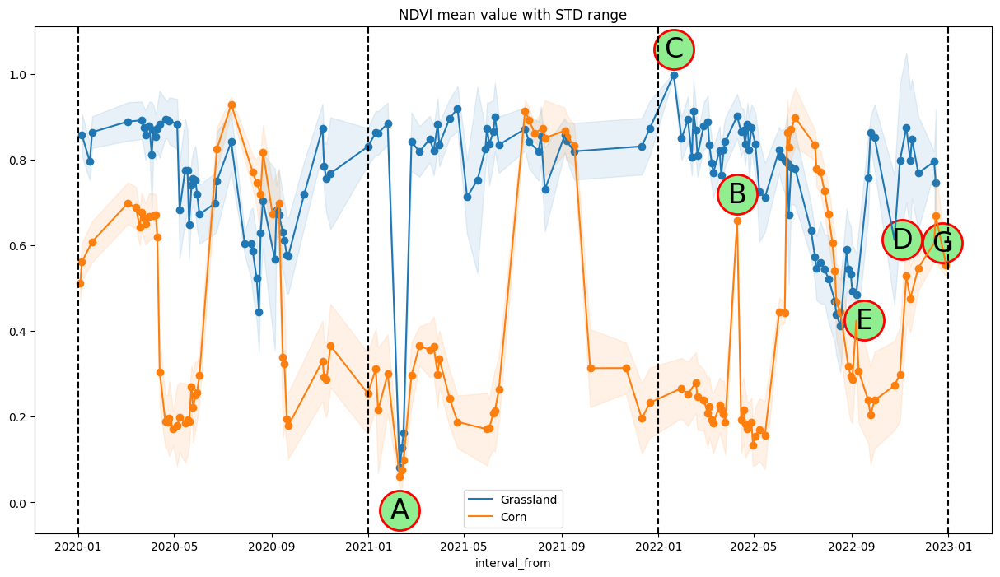

In [42]:
import datetime
fig, ax = plt.subplots(figsize=(15, 8))
 
for idx, land_type in enumerate(polygons_gdf["CROP_TYPE"].values):
    series = features_df[features_df["land_type"] == land_type]

    series.plot(ax=ax, x="interval_from", y="indices_NDVI_mean", color=f"C{idx}", label=land_type)

    # Add the measuring points as dots
    ax.scatter(series["interval_from"].values, series["indices_NDVI_mean"].values, color=f"C{idx}", marker='o')

    ax.fill_between(
        series.interval_from.values,
        series["indices_NDVI_mean"] - series["indices_NDVI_stDev"],
        series["indices_NDVI_mean"] + series["indices_NDVI_stDev"],
        color=f"C{idx}",
        alpha=0.1,
    );

fill_colors = ['lightgray', 'lightblue', 'lightgreen']

ax.set_title('NDVI mean value with STD range')

# Add vertical lines at the specified dates
for date_str in ['2020-01-01', '2021-01-01', '2022-01-01','2023-01-01']:
    date = datetime.datetime.strptime(date_str, "%Y-%m-%d")
    ax.axvline(x=date, color='k', linestyle='--')

from datetime import date
#ax.set_ylim(0,1)
date_loc = date(2021, 2, 9)
y_value = features_df.loc[features_df["interval_from"] == date_loc, "indices_NDVI_mean"].values[0]
ax.scatter(date_loc+ datetime.timedelta(days=0), y_value-0.1, color='red', marker='o', s=1200, facecolors='lightgreen', linewidth=2)
ax.text(date_loc+datetime.timedelta(days=0), y_value-0.1, 'A', fontsize=24, ha='center', va='center', color='k') 
date_loc = date(2022, 4, 10)
y_value = features_df.loc[(features_df["interval_from"] == date_loc)&(features_df["land_type"] == "Corn"), "indices_NDVI_mean"].values[0]
ax.scatter(date_loc+ datetime.timedelta(days=0), y_value+.06, color='red', marker='o', s=1200, facecolors='lightgreen', linewidth=2 )
ax.text(date_loc+datetime.timedelta(days=0), y_value+.06, 'B', fontsize=24, ha='center', va='center', color='k')
date_loc = date(2022, 1, 20)
y_value = features_df.loc[(features_df["interval_from"] == date_loc)&(features_df["land_type"] == "Grassland"), "indices_NDVI_mean"].values[0]
ax.scatter(date_loc+ datetime.timedelta(days=0), y_value+.06, color='red', marker='o', s=1200, facecolors='lightgreen', linewidth=2 )
ax.text(date_loc+datetime.timedelta(days=0), y_value+.06, 'C', fontsize=24, ha='center', va='center', color='k')
date_loc = date(2022, 10, 25)
y_value = features_df.loc[(features_df["interval_from"] == date_loc)&(features_df["land_type"] == "Grassland"), "indices_NDVI_mean"].values[0]
ax.scatter(date_loc+ datetime.timedelta(days=10), y_value, color='red', marker='o', s=1200, facecolors='lightgreen', linewidth=2 )
ax.text(date_loc+datetime.timedelta(days=10), y_value, 'D', fontsize=24, ha='center', va='center', color='k')
date_loc = date(2022, 9, 7)
y_value = features_df.loc[(features_df["interval_from"] == date_loc)&(features_df["land_type"] == "Corn"), "indices_NDVI_mean"].values[0]
ax.scatter(date_loc+ datetime.timedelta(days=10), y_value, color='red', marker='o', s=1200, facecolors='lightgreen', linewidth=2 )
ax.text(date_loc+datetime.timedelta(days=10), y_value, 'E', fontsize=24, ha='center', va='center', color='k')

date_loc = date(2022, 12, 14)
y_value = features_df.loc[(features_df["interval_from"] == date_loc)&(features_df["land_type"] == "Corn"), "indices_NDVI_mean"].values[0]
ax.scatter(date_loc+ datetime.timedelta(days=10), y_value, color='red', marker='o', s=1200, facecolors='lightgreen', linewidth=2 )
ax.text(date_loc+datetime.timedelta(days=10), y_value, 'G', fontsize=24, ha='center', va='center', color='k')

## Analysis of the marked dates

### A
Ok, so what happened there in Februari 2021? 
The grassland NDVI was very low so let's get the dates for these low values beneath 0.2

In [43]:
features_df[(features_df['land_type']=='Grassland') & (features_df['indices_NDVI_mean']<0.2)]

,interval_from,interval_to,indices_NDVI_min,indices_NDVI_max,indices_NDVI_mean,indices_NDVI_stDev,indices_NDVI_sampleCount,indices_NDVI_noDataCount,indices_NDVI_percentiles_5.0,indices_NDVI_percentiles_95.0,...,bands_B12_min,bands_B12_max,bands_B12_mean,bands_B12_stDev,bands_B12_sampleCount,bands_B12_noDataCount,bands_B12_percentiles_5.0,bands_B12_percentiles_95.0,bands_B12_percentiles_50.0,land_type
52,2021-02-09,2021-02-10,0.0094,0.6230,0.082226,0.035771,3021,1272,0.0536,0.1494,...,0.0401,0.1416,0.098304,0.009519,3021,1272,0.0817,0.1076,0.1002,Grassland
53,2021-02-12,2021-02-13,0.0622,0.4184,0.127409,0.044015,3021,1272,0.0854,0.2224,...,0.0350,0.1683,0.065781,0.012325,3021,1272,0.0553,0.0869,0.0634,Grassland
54,2021-02-14,2021-02-15,0.0704,0.5158,0.161239,0.055167,3021,1272,0.1038,0.2770,...,0.0510,0.2050,0.078273,0.013536,3021,1272,0.0663,0.1035,0.0760,Grassland


### C

Further inspection of the other data

In [44]:
features_df[(features_df['land_type']=='Grassland') & (features_df['indices_NDVI_mean']>.96)]

,interval_from,interval_to,indices_NDVI_min,indices_NDVI_max,indices_NDVI_mean,indices_NDVI_stDev,indices_NDVI_sampleCount,indices_NDVI_noDataCount,indices_NDVI_percentiles_5.0,indices_NDVI_percentiles_95.0,...,bands_B12_min,bands_B12_max,bands_B12_mean,bands_B12_stDev,bands_B12_sampleCount,bands_B12_noDataCount,bands_B12_percentiles_5.0,bands_B12_percentiles_95.0,bands_B12_percentiles_50.0,land_type
81,2022-01-20,2022-01-21,0.918,0.999,0.998086,0.005264,3021,2676,0.9976,0.999,...,0.0151,0.0347,0.024626,0.004378,3021,2676,0.0179,0.0328,0.024,Grassland


### D

In [45]:
features_df[(features_df['land_type']=='Grassland') & (features_df['indices_NDVI_mean']<0.7) & (features_df['interval_from']>date(2022, 10, 1))]

,interval_from,interval_to,indices_NDVI_min,indices_NDVI_max,indices_NDVI_mean,indices_NDVI_stDev,indices_NDVI_sampleCount,indices_NDVI_noDataCount,indices_NDVI_percentiles_5.0,indices_NDVI_percentiles_95.0,...,bands_B12_min,bands_B12_max,bands_B12_mean,bands_B12_stDev,bands_B12_sampleCount,bands_B12_noDataCount,bands_B12_percentiles_5.0,bands_B12_percentiles_95.0,bands_B12_percentiles_50.0,land_type
131,2022-10-25,2022-10-26,0.2406,0.844,0.612609,0.151564,3021,2256,0.3158,0.8012,...,0.0465,0.35,0.088992,0.049639,3021,2256,0.0498,0.1675,0.0729,Grassland


In [46]:
features_df[(features_df['land_type']=='Grassland') & (features_df['indices_NDVI_mean']<0.8) & (features_df['interval_from']>date(2021, 4, 1)) & (features_df['interval_from']<date(2021, 6, 1))]

,interval_from,interval_to,indices_NDVI_min,indices_NDVI_max,indices_NDVI_mean,indices_NDVI_stDev,indices_NDVI_sampleCount,indices_NDVI_noDataCount,indices_NDVI_percentiles_5.0,indices_NDVI_percentiles_95.0,...,bands_B12_min,bands_B12_max,bands_B12_mean,bands_B12_stDev,bands_B12_sampleCount,bands_B12_noDataCount,bands_B12_percentiles_5.0,bands_B12_percentiles_95.0,bands_B12_percentiles_50.0,land_type
63,2021-05-05,2021-05-06,0.5458,0.8852,0.712695,0.086440,3021,1886,0.6074,0.8652,...,0.0906,0.2047,0.120822,0.013410,3021,1886,0.0988,0.1396,0.1218,Grassland
64,2021-05-18,2021-05-19,0.0792,0.9238,0.752378,0.217286,3021,1272,0.2008,0.9080,...,0.0148,0.5495,0.117685,0.112118,3021,1272,0.0194,0.4124,0.0851,Grassland


## B

In [47]:
features_df[(features_df['land_type']=='Corn') & (features_df['indices_NDVI_mean']>0.6) & (features_df['interval_from']>date(2022, 4, 1)) & (features_df['interval_from']<date(2022, 6, 1))]

,interval_from,interval_to,indices_NDVI_min,indices_NDVI_max,indices_NDVI_mean,indices_NDVI_stDev,indices_NDVI_sampleCount,indices_NDVI_noDataCount,indices_NDVI_percentiles_5.0,indices_NDVI_percentiles_95.0,...,bands_B12_min,bands_B12_max,bands_B12_mean,bands_B12_stDev,bands_B12_sampleCount,bands_B12_noDataCount,bands_B12_percentiles_5.0,bands_B12_percentiles_95.0,bands_B12_percentiles_50.0,land_type
89,2022-04-10,2022-04-11,0.652,0.6652,0.6582,0.005418,1749,1746,0.6574,0.6652,...,0.1573,0.1831,0.1745,0.012162,1749,1746,0.1831,0.1831,0.1831,Corn


## E

In [48]:
features_df[(features_df['land_type']=='Corn') & (features_df['indices_NDVI_mean']>0.4) & (features_df['interval_from']>date(2022, 9, 1)) & (features_df['interval_from']<date(2022, 10, 1))]

,interval_from,interval_to,indices_NDVI_min,indices_NDVI_max,indices_NDVI_mean,indices_NDVI_stDev,indices_NDVI_sampleCount,indices_NDVI_noDataCount,indices_NDVI_percentiles_5.0,indices_NDVI_percentiles_95.0,...,bands_B12_min,bands_B12_max,bands_B12_mean,bands_B12_stDev,bands_B12_sampleCount,bands_B12_noDataCount,bands_B12_percentiles_5.0,bands_B12_percentiles_95.0,bands_B12_percentiles_50.0,land_type
117,2022-09-07,2022-09-08,0.2546,0.5898,0.42428,0.096508,1749,1714,0.269,0.5852,...,0.1226,0.1672,0.148994,0.012177,1749,1714,0.1275,0.1672,0.1528,Corn


### F

In [49]:
features_df[(features_df['land_type']=='Corn') & (features_df['indices_NDVI_mean']>0.8) & (features_df['interval_from']<date(2020, 9, 1))]

,interval_from,interval_to,indices_NDVI_min,indices_NDVI_max,indices_NDVI_mean,indices_NDVI_stDev,indices_NDVI_sampleCount,indices_NDVI_noDataCount,indices_NDVI_percentiles_5.0,indices_NDVI_percentiles_95.0,...,bands_B12_min,bands_B12_max,bands_B12_mean,bands_B12_stDev,bands_B12_sampleCount,bands_B12_noDataCount,bands_B12_percentiles_5.0,bands_B12_percentiles_95.0,bands_B12_percentiles_50.0,land_type
28,2020-06-24,2020-06-25,0.4412,0.8930,0.824698,0.050816,1749,427,0.7366,0.8760,...,0.0806,0.2115,0.108192,0.020819,1749,427,0.0856,0.1438,0.1021,Corn
29,2020-07-12,2020-07-13,0.7448,0.9456,0.929052,0.017825,1749,427,0.8976,0.9398,...,0.0522,0.1210,0.061202,0.010725,1749,427,0.0538,0.0845,0.0575,Corn
33,2020-08-21,2020-08-22,0.2256,0.8950,0.817565,0.062454,1749,427,0.7546,0.8632,...,0.0713,0.2538,0.087981,0.022724,1749,427,0.0754,0.1392,0.0802,Corn


#### G

In [50]:
features_df[(features_df['land_type']=='Corn') & (features_df['indices_NDVI_mean']>0.6) & (features_df['interval_from']>date(2022, 11, 1))]

,interval_from,interval_to,indices_NDVI_min,indices_NDVI_max,indices_NDVI_mean,indices_NDVI_stDev,indices_NDVI_sampleCount,indices_NDVI_noDataCount,indices_NDVI_percentiles_5.0,indices_NDVI_percentiles_95.0,...,bands_B12_min,bands_B12_max,bands_B12_mean,bands_B12_stDev,bands_B12_sampleCount,bands_B12_noDataCount,bands_B12_percentiles_5.0,bands_B12_percentiles_95.0,bands_B12_percentiles_50.0,land_type
127,2022-12-14,2022-12-15,0.4724,0.7814,0.604965,0.043151,1749,447,0.5316,0.6778,...,0.0589,0.1349,0.085777,0.011233,1749,447,0.0707,0.1045,0.0846,Corn
128,2022-12-16,2022-12-17,0.3044,0.8632,0.669160,0.108976,1749,1272,0.4488,0.8144,...,0.0118,0.1789,0.033381,0.031752,1749,1272,0.0138,0.0978,0.0203,Corn


## Visual inspection of the anomalies

For the notebook I wrote a function to display the images based on field number and date.

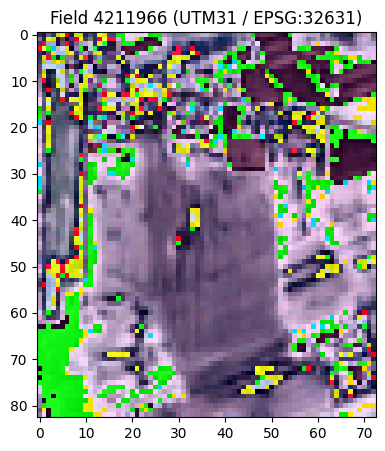

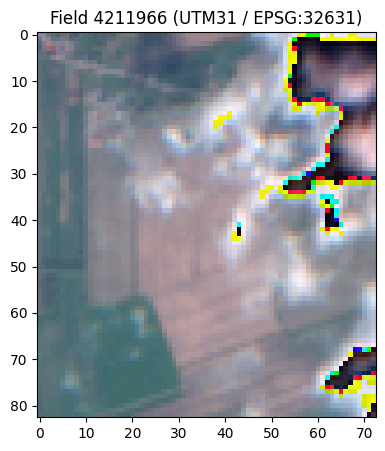

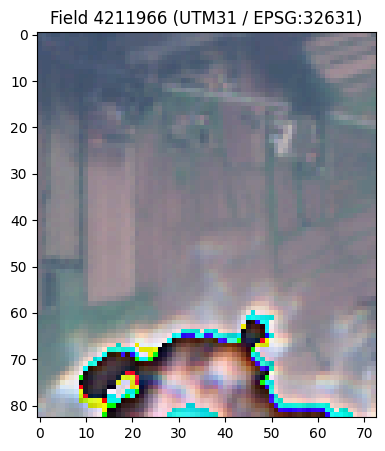

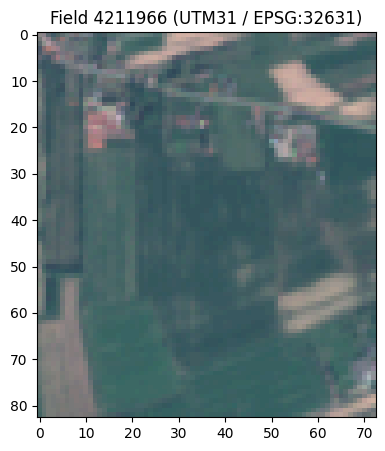

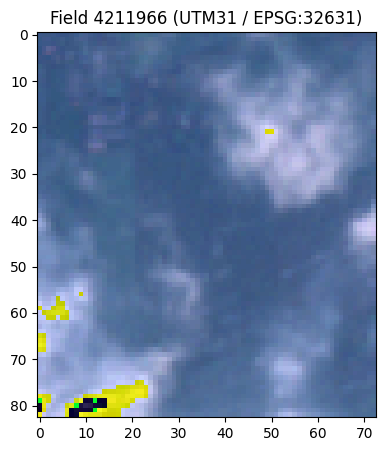

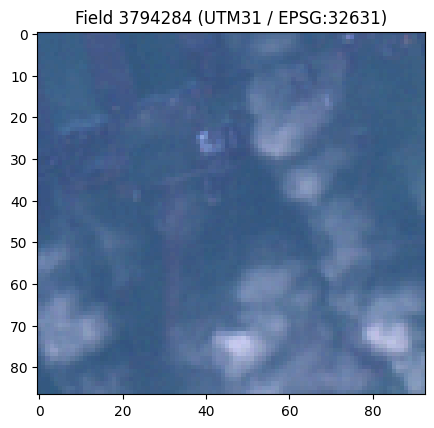

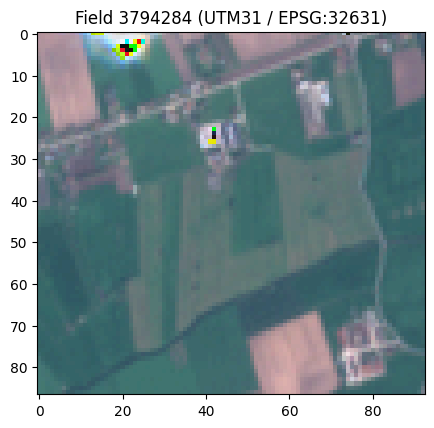

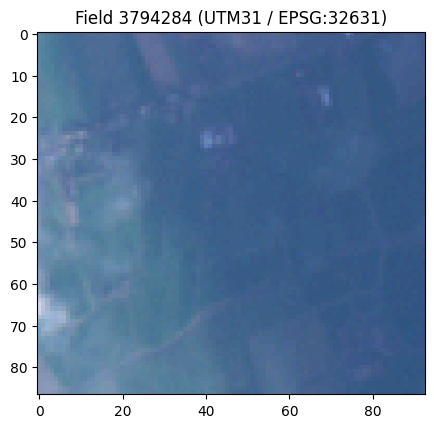

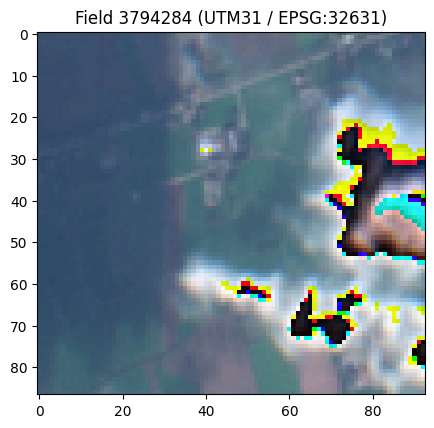

In [51]:
from scripts.load_field_image import load_field_image  

load_field_image(4211966,'2021-02-09') # A 
load_field_image(4211966,'2022-04-10') # B
load_field_image(4211966,'2022-09-07') # E
load_field_image(4211966,'2020-06-24') # F
load_field_image(4211966,'2022-12-16') # G  Clouds
load_field_image(3794284,'2022-12-16') # G  Clouds
	
load_field_image(3794284,'2021-05-05') 
load_field_image(3794284,'2022-01-20') # C
load_field_image(3794284,'2022-10-25')

In [52]:
features_df.iloc[84]

interval_from                 2022-02-12
interval_to                   2022-02-13
indices_NDVI_min                  0.5276
indices_NDVI_max                  0.8656
indices_NDVI_mean               0.805079
                                 ...    
bands_B12_noDataCount               2256
bands_B12_percentiles_5.0         0.0962
bands_B12_percentiles_95.0         0.112
bands_B12_percentiles_50.0        0.1017
land_type                      Grassland
Name: 84, Length: 165, dtype: object

## Plotting the cloud probability

We can check the mean values from the cloud probability indicator for each date.

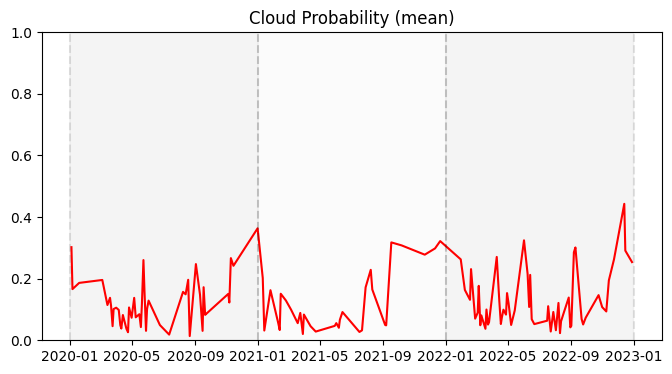

In [53]:
import datetime

fig, ax = plt.subplots(figsize=(8, 4))

x=features_df[features_df["land_type"]=="Corn"]["interval_from"].values
y=features_df[features_df["land_type"]=="Corn"]['indices_CLP_mean'].values

ax.plot(x, y, color='red')

# Add vertical lines at the specified dates and fill spaces with different colors
date_strs = ['2020-01-01', '2021-01-01', '2022-01-01','2023-01-01']
fill_colors = ['#999999', '#DCDCDC', '#999999']

for i in range(len(date_strs) - 1):
    date1 = datetime.datetime.strptime(date_strs[i], "%Y-%m-%d")
    date2 = datetime.datetime.strptime(date_strs[i + 1], "%Y-%m-%d")
    ax.axvline(x=date1, color='k', linestyle='--', alpha=0.1)
    ax.axvline(x=date2, color='k', linestyle='--', alpha=0.1)
    ax.fill_between(
        [date1, date2],
        ax.set_ylim(1,2),
        color=fill_colors[i],
        alpha=0.1,
    )
ax.set_title('Cloud Probability (mean)')
ax.set_ylim(0,1)
plt.show()


## NDSI Normalised Difference Snow Index

We plot the NDSI to detect if snow cover is interfering with the reflectance values in our data.

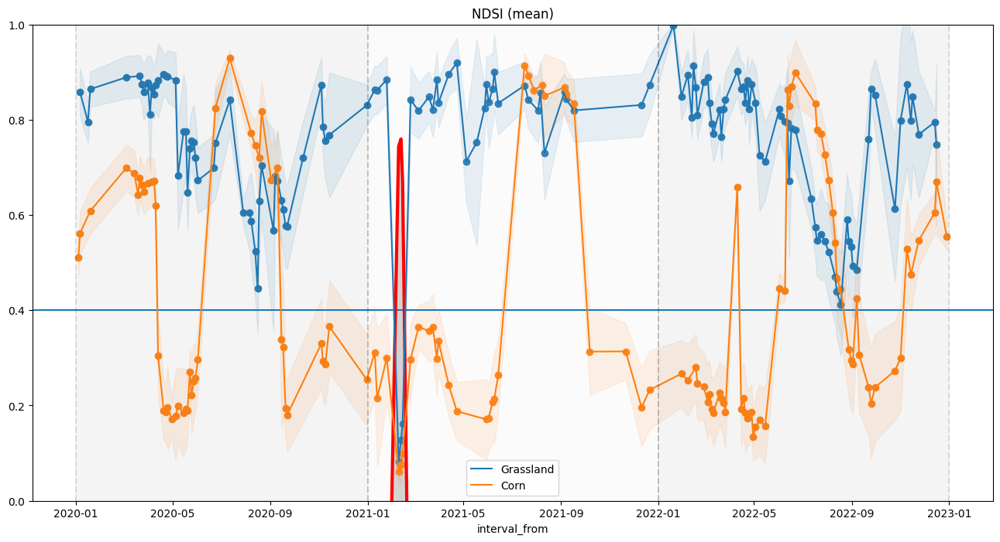

In [54]:
import datetime

fig, ax = plt.subplots(figsize=(16, 8))
ax.axhline(0.4,linestyle='solid')

# Plot the curve
x = features_df[features_df["land_type"]=="Grassland"]["interval_from"].values
y = features_df[features_df["land_type"]=="Grassland"]['indices_NDSI_mean'].values
ax.plot(x, y, color='red', linewidth=3)

# Fill the area underneath the curve between 0 and the curve
ax.fill_between(x, y, 0, where=(y>0), interpolate=True, color='lightgrey')


for idx, land_type in enumerate(polygons_gdf["CROP_TYPE"].values):
    series = features_df[features_df["land_type"] == land_type]

    series.plot(ax=ax, x="interval_from", y="indices_NDVI_mean", color=f"C{idx}", label=land_type)

    ax.scatter(series["interval_from"].values, series["indices_NDVI_mean"].values, color=f"C{idx}", marker='o')

    ax.fill_between(
        series.interval_from.values,
        series["indices_NDVI_mean"] - series["indices_NDVI_stDev"],
        series["indices_NDVI_mean"] + series["indices_NDVI_stDev"],
        color=f"C{idx}",
        alpha=0.1,
    )

    

# Add vertical lines at the specified dates and fill spaces with different colors
date_strs = ['2020-01-01', '2021-01-01', '2022-01-01','2023-01-01']
fill_colors = ['#999999', '#DCDCDC', '#999999']

for i in range(len(date_strs) - 1):
    date1 = datetime.datetime.strptime(date_strs[i], "%Y-%m-%d")
    date2 = datetime.datetime.strptime(date_strs[i + 1], "%Y-%m-%d")
    ax.axvline(x=date1, color='k', linestyle='--', alpha=0.1)
    ax.axvline(x=date2, color='k', linestyle='--', alpha=0.1)
    ax.fill_between(
        [date1, date2],
        ax.set_ylim(1,2),
        color=fill_colors[i],
        alpha=0.1,
    )
ax.set_title('NDSI (mean)')
ax.set_ylim(0,1)
plt.show()

### Remove bad data

We remove the data that we have confirmed to be invalid.

In [55]:
features_df_clean=features_df.copy()
features_df_clean=features_df_clean[~features_df_clean['interval_from'].astype(str).isin(['2021-02-09', '2021-02-12', '2021-02-14','2022-12-16'])] # A & G
features_df_clean=features_df_clean[~(features_df_clean['interval_from'].astype(str).isin(['2022-04-10','2022-09-07'])&(features_df_clean['land_type']=="Corn"))] # B & E
features_df_clean=features_df_clean[~(features_df_clean['interval_from'].astype(str).isin(['2022-01-20','2022-10-25'])&(features_df_clean['land_type']=="Grassland"))] # C & D

# Result

We plot the resulting chart, filtered and cleaned to show the mean NDVI value for both of our fields in the timespan of 3 years.

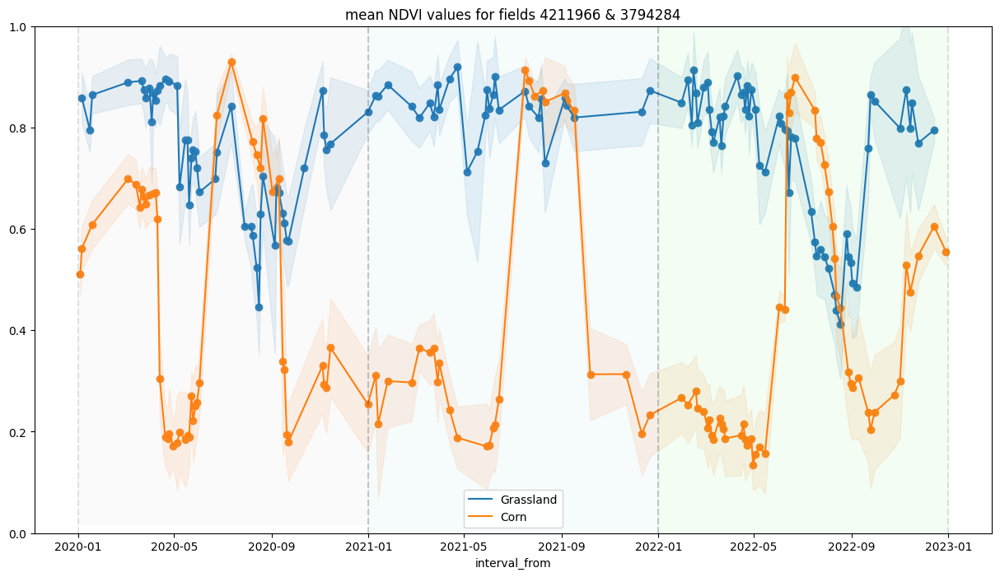

In [56]:
import datetime

fig, ax = plt.subplots(figsize=(15, 8))

for idx, land_type in enumerate(polygons_gdf["CROP_TYPE"].values):
    series = features_df_clean[features_df_clean["land_type"] == land_type]

    series.plot(ax=ax, x="interval_from", y="indices_NDVI_mean", color=f"C{idx}", label=land_type)

    ax.scatter(series["interval_from"].values, series["indices_NDVI_mean"].values, color=f"C{idx}", marker='o')

    ax.fill_between(
        series.interval_from.values,
        series["indices_NDVI_mean"] - series["indices_NDVI_stDev"],
        series["indices_NDVI_mean"] + series["indices_NDVI_stDev"],
        color=f"C{idx}",
        alpha=0.1,
    )

# Add vertical lines at the specified dates and fill spaces with different colors
date_strs = ['2020-01-01', '2021-01-01', '2022-01-01','2023-01-01']
fill_colors = ['lightgray', 'lightblue', 'lightgreen']

for i in range(len(date_strs) - 1):
    date1 = datetime.datetime.strptime(date_strs[i], "%Y-%m-%d")
    date2 = datetime.datetime.strptime(date_strs[i + 1], "%Y-%m-%d")
    ax.axvline(x=date1, color='k', linestyle='--', alpha=0.1)
    ax.axvline(x=date2, color='k', linestyle='--', alpha=0.1)
    ax.fill_between(
        [date1, date2],
        ax.get_ylim()[0],
        ax.get_ylim()[1],
        color=fill_colors[i],
        alpha=0.1,
    )
ax.set_title('mean NDVI values for fields 4211966 & 3794284')
ax.set_ylim(0,1)
plt.show()

# Violin charts

This code will export violin charts for the NDVI distribution of both regions for all the datapoints that we obtained. Plots with no data will be skipped.

In [57]:
from datetime import datetime,date
date_str = '2022-01'
date_format = '%Y-%m'

date_obj = datetime.strptime(date_str, date_format)
print(date_obj)

2022-01-01 00:00:00


In [58]:
features_df[(features_df['land_type']=='Corn') & (features_df['indices_NDVI_mean']>0.5) & (features_df['interval_from']>date(2022, 3, 1)) & (features_df['interval_from']<date(2022, 5, 1)) ][['interval_from','indices_CLP_mean']]

,interval_from,indices_CLP_mean
89,2022-04-10,0.2706


In [59]:
features_df[(features_df['land_type']=='Corn') & (features_df['indices_NDVI_mean']>0.5) & (features_df['interval_from']>date(2022, 10, 1)) & (features_df['interval_from']<date(2023, 1, 1)) ][['interval_from','indices_CLP_mean']]

,interval_from,indices_CLP_mean
124,2022-11-09,0.093575
126,2022-11-24,0.262754
127,2022-12-14,0.443009
128,2022-12-16,0.291093
129,2022-12-29,0.253870


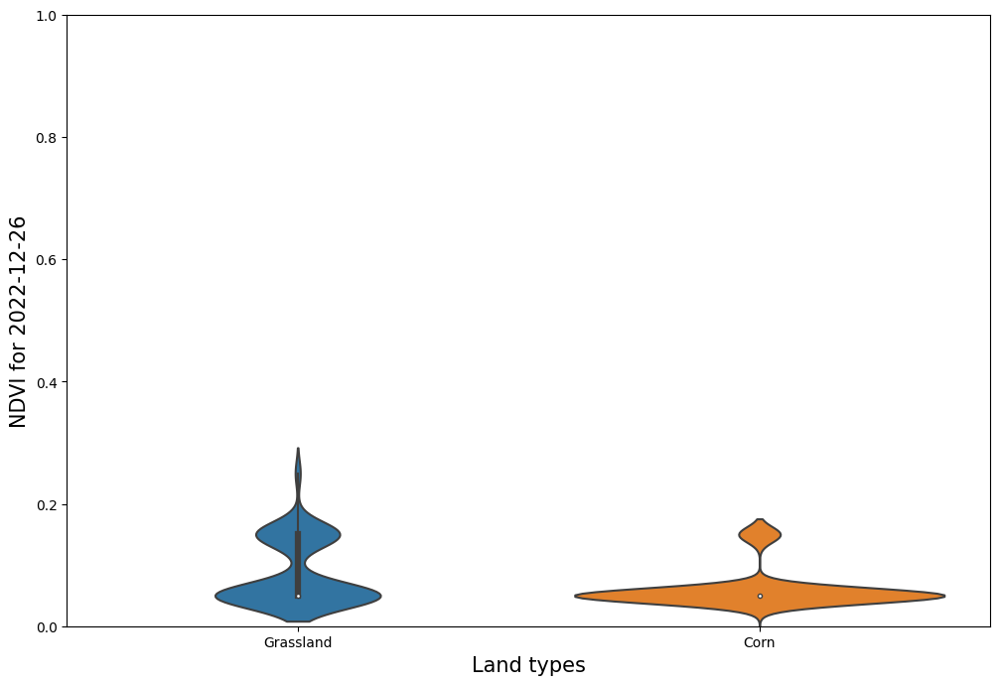

In [61]:
for ts_index,TIMESTAMP_INDEX in enumerate(range (432)):
    plot_data = []
    timestamp = None
    for idx, stats in enumerate(ndvi_stats):
        bins = stats["data"][TIMESTAMP_INDEX]["outputs"]["ndvi"]["bands"]["B0"]["histogram"]["bins"]
        timestamp = stats["data"][TIMESTAMP_INDEX]["interval"]["from"].split("T")[0]

        counts = [value["count"] for value in bins]
        total_counts = sum(counts)
        counts = [round(100 * count / total_counts) for count in counts]

        bin_size = bins[1]["lowEdge"] - bins[0]["lowEdge"]
        splits = [value["lowEdge"] + bin_size / 2 for value in bins]

        data = []
        for count, split in zip(counts, splits):
            data.extend([split] * count)
        plot_data.append(np.array(data)) 

    if not all(x == np.array(data)[0] for x in np.array(data)):
        fig, ax = plt.subplots(figsize=(12, 8))
        ax = sns.violinplot(data=plot_data, ax=ax)
        ax.set(xticklabels=polygons_gdf["CROP_TYPE"].values)
        ax.set_ylim(0,1)
        plt.xlabel("Land types", fontsize=15)
        plt.ylabel(f"NDVI for {timestamp}", fontsize=15);
        plt.savefig(f"./data/export/ndvi_stats_{ts_index}")
        plt.close(fig)
 